# Table of Contents

* [Import Dataset](#Section-1)
* [Install Libraries](#Section-2)
* [Import Libraries](#Section-3)
* [Model Training](#Section-4)
* [Model Analysis](#Section-5)
* [Object Detection](#Section-6)
* [Object Detection in Video](#Section-7)
        

<a id="Section-1" ></a>
# Import Dataset

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggAXle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

<a id="Section-2" ></a>
# Install Libraries

In [2]:
pip install -U ipywidgets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 54.6 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab-widgets 3.0.9
    Uninstalling jupyterlab-widgets-3.0.9:
      Successfully uninstalled jupyterlab-widgets-3.0.9
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ultralytics 

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.6/793.6 kB 20.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


<a id="Section-3" ></a>
# Import Libraries

In [5]:
import warnings
warnings.filterwarnings("ignore", message=".*will create.*worker processes.*")
warnings.filterwarnings("ignore", message="os.fork() was called.*")
os.environ['OMP_NUM_THREADS'] = '1' 

In [6]:
import torch.multiprocessing as mp
# Set start method to 'spawn'
mp.set_start_method('spawn', force=True)

In [7]:
!wandb disabled

W&B disabled.


In [8]:
from ultralytics import YOLO

<a id="Section-4" ></a>
# Training of Yolo v8n Model  on Custom dataset

In [9]:
yaml_path = "/kaggle/input/data-updated/data.yaml"


model = YOLO("yolov8n.pt")  # Load a pretrained YOLOv10 model

model.info()

# Train the model
results = model.train(data=yaml_path,epochs=15,verbose=True,)

100%|██████████| 6.23M/6.23M [00:00<00:00, 92.7MB/s]


YOLOv8n summary: 225 layers, 3157200 parameters, 0 gradients, 8.9 GFLOPs
Ultralytics YOLOv8.2.43 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/data-updated/data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=Fal

100%|██████████| 755k/755k [00:00<00:00, 21.6MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/train/labels... 10308 images, 623 backgrounds, 0 corrupt: 100%|██████████| 10308/10308 [00:51<00:00, 199.88it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/labels... 972 images, 30 backgrounds, 0 corrupt: 100%|██████████| 972/972 [00:04<00:00, 202.57it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15       2.4G      1.434      1.288      1.106         41        640: 100%|██████████| 645/645 [02:18<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


                   all        972       5407      0.823      0.598      0.655      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      2.22G      1.405     0.9555      1.113         39        640: 100%|██████████| 645/645 [02:08<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:08<00:00,  3.84it/s]

                   all        972       5407      0.809      0.615      0.673      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      2.23G      1.393     0.8981      1.108         29        640: 100%|██████████| 645/645 [02:06<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.44it/s]


                   all        972       5407      0.678       0.63      0.667      0.378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      2.32G      1.354     0.8491      1.098         18        640: 100%|██████████| 645/645 [02:07<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.65it/s]

                   all        972       5407      0.906      0.637      0.721      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      2.31G      1.321     0.8042      1.077         26        640: 100%|██████████| 645/645 [02:08<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.57it/s]

                   all        972       5407      0.833      0.657      0.733      0.429


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      2.33G       1.28     0.7415      1.084         25        640: 100%|██████████| 645/645 [02:10<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:07<00:00,  4.36it/s]


                   all        972       5407      0.847      0.658      0.729      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      2.33G       1.25     0.7096      1.072         12        640: 100%|██████████| 645/645 [02:14<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.58it/s]

                   all        972       5407      0.822      0.635      0.703      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      2.35G      1.228     0.6814      1.059         20        640: 100%|██████████| 645/645 [02:09<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.67it/s]

                   all        972       5407      0.871      0.693      0.763      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      2.32G      1.197     0.6583       1.05          5        640: 100%|██████████| 645/645 [02:08<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.56it/s]

                   all        972       5407      0.868      0.665      0.763      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      2.31G      1.173     0.6289      1.037         14        640: 100%|██████████| 645/645 [02:08<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.62it/s]

                   all        972       5407      0.871      0.698      0.774      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      2.36G      1.158     0.6162      1.033         12        640: 100%|██████████| 645/645 [02:10<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.52it/s]

                   all        972       5407      0.901      0.699      0.787      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      2.32G      1.137     0.5999      1.025         16        640: 100%|██████████| 645/645 [02:09<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.55it/s]

                   all        972       5407      0.857      0.734      0.805      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      2.32G      1.112     0.5802      1.014         13        640: 100%|██████████| 645/645 [02:09<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.53it/s]

                   all        972       5407      0.926      0.717      0.803      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      2.34G      1.089     0.5638      1.006          8        640: 100%|██████████| 645/645 [02:08<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.45it/s]

                   all        972       5407      0.887       0.73      0.806      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      2.35G      1.065     0.5471     0.9965         11        640: 100%|██████████| 645/645 [02:08<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:06<00:00,  4.45it/s]

                   all        972       5407       0.89      0.726      0.807      0.517



15 epochs completed in 0.579 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.43 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


                   all        972       5407       0.89      0.725      0.807      0.517
              football        241        275      0.855      0.524      0.663      0.358
                player        936       5132      0.926      0.927      0.951      0.676
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


<a id="Section-5" ></a>
# Model Analysis

In [10]:
# Path to the data configuration file (data.yaml)
data_config = '/kaggle/input/data-updated/data.yaml'

# Validate the model
results = model.val(data=data_config)


Ultralytics YOLOv8.2.43 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/labels... 972 images, 30 backgrounds, 0 corrupt: 100%|██████████| 972/972 [00:01<00:00, 946.44it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 61/61 [00:12<00:00,  4.97it/s]


                   all        972       5407      0.884       0.73      0.807       0.52
              football        241        275      0.845      0.531      0.662      0.363
                player        936       5132      0.923      0.929      0.952      0.676
Speed: 0.2ms preprocess, 4.4ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train2


In [11]:
# Extract metrics from results
precision = results.box.maps[0]  # Precision for IoU threshold 0.5
recall = results.box.maps[1]     # Recall for IoU threshold 0.5
f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) != 0 else 0  # F1 Score calculation
map_50 = results.box.maps[0]      # mAP@0.5
map_50_95 = results.box.maps.mean()  # mAP@0.5:0.95

# Accuracy is not directly available; hence, we use (TP) / (TP + FP + FN) as a proxy for accuracy
# If TP, FP, FN were tracked, it would be easier. Here, we'll rely on a simplified estimation

# Note: This calculation is illustrative and not a standard practice for object detection accuracy
accuracy = results.box.maps[0]  # Using mAP@0.5 as a proxy for accuracy

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"mAP@0.5: {map_50:.4f}")
print(f"mAP@0.5:0.95: {map_50_95:.4f}")
print(f"Accuracy (approx): {accuracy:.4f}")


Precision: 0.3633
Recall: 0.6765
F1 Score: 0.4727
mAP@0.5: 0.3633
mAP@0.5:0.95: 0.5199
Accuracy (approx): 0.3633


<a id="Section-6" ></a>
# Object Detection

In [12]:
import random
import os
import cv2
import matplotlib.pyplot as plt
import shutil


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/18_pp_jpg.rf.6b15f3ae95ac50373a07dde3e19e0497.jpg: 640x640 2 persons, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


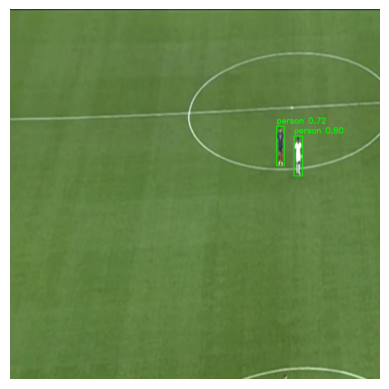


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/458_pp_jpg.rf.13528816f83ae94fe429dcc0fc3d3ac1.jpg: 640x640 10 persons, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


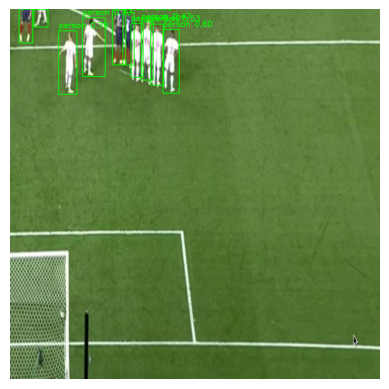


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/55264_jpg.rf.edcfcca352de1749ee7df45bc36e2231.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


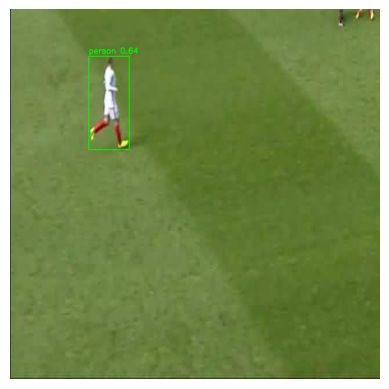


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/54690_jpg.rf.cf7ad5e038298e07a2426c3bb84632b0.jpg: 640x640 12 persons, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


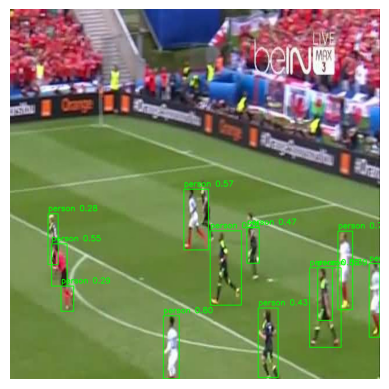


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/54857_jpg.rf.5226fc1b816732290a6eb2af8f4b0993.jpg: 640x640 1 bird, 1 sports ball, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


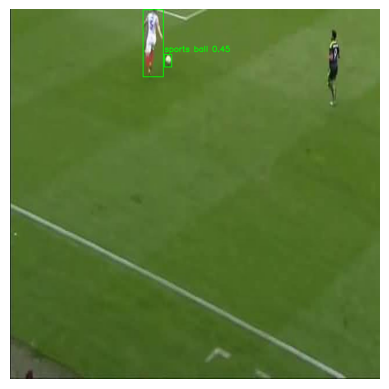


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/201_pp_jpg.rf.5ed535190a2d52353baa0fb3ec7d014a.jpg: 640x640 1 tennis racket, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


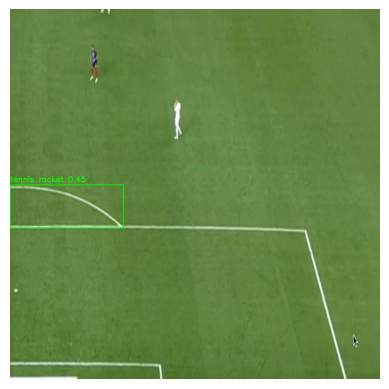


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/5556_jpg.rf.560a1c484eda4f3c0ee4055297b0ed8b.jpg: 640x640 3 persons, 1 tennis racket, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


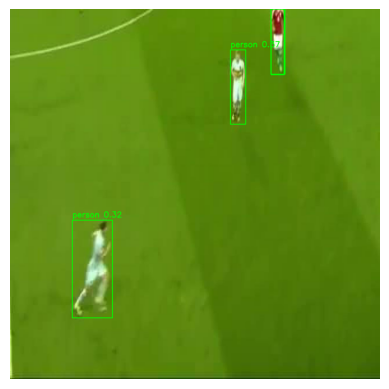


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/55171_jpg.rf.c7293f3836aa5d9b73d9896d024306f4.jpg: 640x640 1 person, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


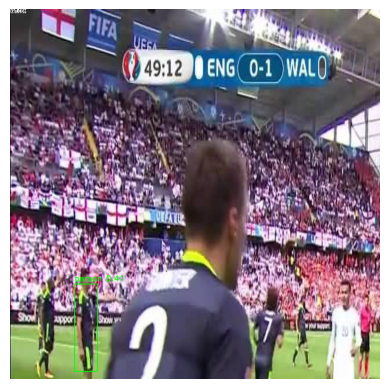


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/55184_jpg.rf.78a3a4335b115ca23a7c4af13d160715.jpg: 640x640 4 persons, 1 train, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


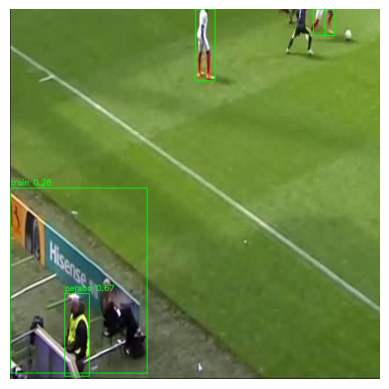


image 1/1 /kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images/54744_jpg.rf.4abbb7f7bd6e23fc46959d8743b30e22.jpg: 640x640 2 persons, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


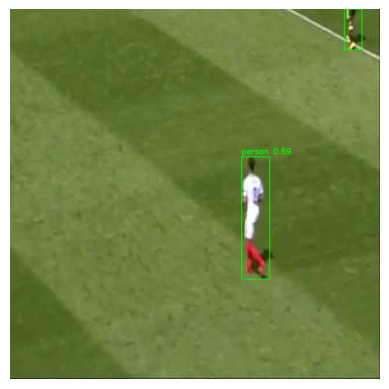

In [13]:

# Load the YOLOv8 model (replace 'your_model.pt' with your trained model path)
model = YOLO('/kaggle/working/yolov8n.pt')

# Directory where validation images are stored
val_images_dir = '/kaggle/input/football-player-detection-yolov8/football_players_detection/football_players_detection/valid/images'

# List all files in the validation directory
all_images = [f for f in os.listdir(val_images_dir) if os.path.isfile(os.path.join(val_images_dir, f))]

# Randomly select 10 images from the validation set
selected_images = random.sample(all_images, 10)

def display_image_with_predictions(image_path, predictions):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for pred in predictions:
        x1, y1, x2, y2, conf, cls = pred
        label = f"{model.names[int(cls)]} {conf:.2f}"
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(img, label, (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Process and display each selected image
for img_name in selected_images:
    img_path = os.path.join(val_images_dir, img_name)
    results = model(img_path)
    display_image_with_predictions(img_path, results[0].boxes.data.cpu().numpy())



<a id="Section-7" ></a>
# Object Detection in Video

In [14]:
from IPython.display import HTML, display
from base64 import b64encode

def display_video(video_path, width=None, height=None):
    # Read the video file
    with open(video_path, 'rb') as f:
        video_data = f.read()
    
    # Encode the video data to base64
    video_encoded = b64encode(video_data).decode()
    
    # Construct the data URL for the video
    data_url = f"data:video/mp4;base64,{video_encoded}"
    
    # Construct the HTML video tag with custom dimensions
    html_video = HTML(f"""
    <video controls {'width="%s"' % width if width else ''} {'height="%s"' % height if height else ''}>
          <source src="{data_url}" type="video/mp4">
          Your browser does not support the video tag.
    </video>
    """)
    
    # Display the HTML video tag
    display(html_video)

In [15]:
model = YOLO('/kaggle/working/yolov8n.pt')

# Open the video file
input_video_path = '/kaggle/input/football-player-detection-yolov8/video.mp4'
# Create a directory to store annotated frames
output_dir = 'annotated_frames'
output_path = 'output_video.mp4'


cap = cv2.VideoCapture(input_video_path)

# Get video properties
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))


# Remove the directory if it exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)

# Create the directory
os.makedirs(output_dir, exist_ok=True)

print(f"Directory '{output_dir}' has been created.")

os.makedirs(output_dir, exist_ok=True)

frame_index = 0  # Index for the annotated frames


# Process the video frame by frame
while cap.isOpened():
    ret, input_image = cap.read()
    
    if not ret:
      break

#     # Perform object detection
#     results = t_model(input_image)
    results = model.predict(input_image,imgsz=640, conf=0.25)
    
    
    annotated_image = results[0].plot()

        # Save the annotated frame as an image
    annotated_frame_path = os.path.join(output_dir, f'frame_{frame_index:05d}.jpg')
    cv2.imwrite(annotated_frame_path, annotated_image)
    frame_index += 1

# Release resources
cap.release()

# Use ffmpeg to create the video from annotated frames
os.system(f'ffmpeg -framerate {fps} -i {output_dir}/frame_%05d.jpg -c:v libx264 -pix_fmt yuv420p -an {output_path}')


print(f"Video processing complete. The annotated video is saved as '{output_path}'.")


# Call the function with the path to the video file and custom dimensions
video_path = f'/kaggle/working/{output_path}'
display_video(video_path, width=640, height=360)


Directory 'annotated_frames' has been created.



[aac @ 0x582c5f9dad40] Input buffer exhausted before END element found


0: 384x640 22 persons, 94.9ms
Speed: 1.6ms preprocess, 94.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 6.8ms
Speed: 1.8ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 19 persons, 7.4ms
Speed: 1.8ms preprocess, 7.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 20 persons, 6.6ms
Speed: 1.8ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 6.6ms
Speed: 1.8ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 persons, 6.9ms
Speed: 1.8ms preprocess, 6.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 1 sports ball, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.2ms postprocess per image at

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

Video processing complete. The annotated video is saved as 'output_video.mp4'.


frame=  449 fps= 33 q=-1.0 Lsize=    7882kB time=00:00:17.84 bitrate=3619.5kbits/s speed=1.31x    
video:7876kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.078175%
[libx264 @ 0x59a88497ff40] frame I:3     Avg QP:20.49  size: 81001
[libx264 @ 0x59a88497ff40] frame P:114   Avg QP:22.23  size: 34505
[libx264 @ 0x59a88497ff40] frame B:332   Avg QP:27.35  size: 11711
[libx264 @ 0x59a88497ff40] consecutive B-frames:  0.9%  0.0%  4.7% 94.4%
[libx264 @ 0x59a88497ff40] mb I  I16..4: 22.7% 46.0% 31.3%
[libx264 @ 0x59a88497ff40] mb P  I16..4:  7.6% 10.4%  4.6%  P16..4: 35.5% 14.0%  8.1%  0.0%  0.0%    skip:19.8%
[libx264 @ 0x59a88497ff40] mb B  I16..4:  1.3%  0.8%  0.9%  B16..8: 40.8%  7.7%  2.4%  direct: 2.6%  skip:43.4%  L0:50.6% L1:43.7% BI: 5.7%
[libx264 @ 0x59a88497ff40] 8x8 transform intra:40.6% inter:54.5%
[libx264 @ 0x59a88497ff40] coded y,uvDC,uvAC intra: 36.7% 59.3% 28.9% inter: 12.1% 19.9% 8.4%
[libx264 @ 0x59a88497ff40] i16 v,h,dc,p: 24% 57% 10%  9%
